In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import yaml

In [2]:
ANGLE_TYPES = {"3D": [0, 1, 2], "roll": [1, 2], "pitch": [0, 2], "yaw": [0, 1]}

reference_joints = pd.read_csv("../data/squat/features/reference/joints.csv")

In [3]:
with open("../configs/pose_estimators.yaml") as file:
    data = yaml.safe_load(file)
    connections = data["mediapipe"]["connections"]["torso"]

In [47]:
import matplotlib.animation as animation
from IPython.display import HTML

ELEV = 90
AZIM = 90
X_LIM = (-1, 1)
Y_LIM = (-1, 1)
Z_LIM = (-1, 1)


def get_3D_animation(rep: pd.DataFrame) -> animation.FuncAnimation:
    """Return animation of the joints representation in time"""
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")

    def update(i):
        data = rep[rep["frame"] == i]
        ax.clear()

        ax.set_xlim3d(*X_LIM)
        ax.set_ylim3d(*Y_LIM)
        ax.set_zlim3d(*Z_LIM)
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")

        ax.view_init(elev=ELEV + i * 0.5, azim=AZIM + i * 0.5)

        ax.scatter3D(
            xs=[data["x"]],
            ys=[data["y"]],
            zs=[data["z"]],
        )
        for connection in connections:
            joint_start, joint_end = connection
            join_start_data = data[data["id"] == joint_start]
            join_end_data = data[data["id"] == joint_end]
            if join_start_data.empty or join_end_data.empty:
                continue

            ax.plot(
                xs=[join_start_data["x"].values, join_end_data["x"].values],
                ys=[join_start_data["y"].values, join_end_data["y"].values],
                zs=[join_start_data["z"].values, join_end_data["z"].values],
            )

    return animation.FuncAnimation(
        fig, update, frames=len(rep["frame"].unique()), interval=90
    )

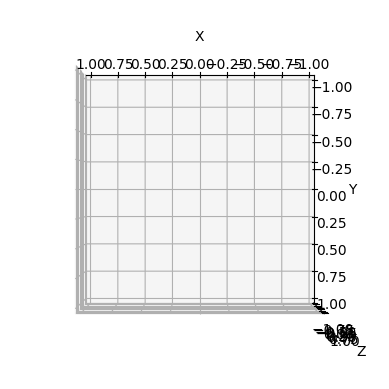

In [48]:
anim = get_3D_animation(reference_joints)
HTML(anim.to_jshtml())

Result:

 Z should be switched with Y axis


In [49]:
import matplotlib.animation as animation
from IPython.display import HTML

ELEV = 90
AZIM = 90
X_LIM = (-1, 1)
Y_LIM = (-1, 1)
Z_LIM = (-1, 1)


def get_3D_animation_fixed(rep: pd.DataFrame) -> animation.FuncAnimation:
    """Return animation of the joints representation in time"""
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")

    def update(i):
        data = rep[rep["frame"] == i]
        ax.clear()

        ax.set_xlim3d(*X_LIM)
        ax.set_ylim3d(*Y_LIM)
        ax.set_zlim3d(*Z_LIM)
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")

        ax.view_init(elev=ELEV + i * 0.5, azim=AZIM + i * 0.5)

        ax.scatter3D(
            xs=[data["x"]],
            zs=[data["y"]],
            ys=[data["z"]],
        )
        for connection in connections:
            joint_start, joint_end = connection
            join_start_data = data[data["id"] == joint_start]
            join_end_data = data[data["id"] == joint_end]
            if join_start_data.empty or join_end_data.empty:
                continue

            ax.plot(
                xs=[join_start_data["x"].values, join_end_data["x"].values],
                zs=[join_start_data["y"].values, join_end_data["y"].values],
                ys=[join_start_data["z"].values, join_end_data["z"].values],
            )

    return animation.FuncAnimation(
        fig, update, frames=len(rep["frame"].unique()), interval=90
    )

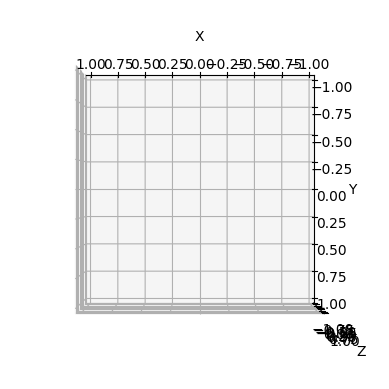

In [50]:
anim = get_3D_animation_fixed(reference_joints)
HTML(anim.to_jshtml())